# Customer Segmentation 

This notebook uses a data set that has around 50000 values. Its a customer centric data set , which has the data of all the orders that have been placed through different vendors and markets, starting from the year 2011 till 2015. Based on the analysis, I have developed a customer segementation through the RFM (recency, frequency, and monetary) segmentation. Furthermore, I have used machine learning with the RFM segmentation to predict future customer's and their potential profitability and engagement. 

All the modules and packages that will be used in this notebook can be seen here. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import plotly.express as px
from IPython import display 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
import sklearn.cluster
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering, DBSCAN
from sklearn.decomposition import PCA

# Data Wrangling

The data is loaded to understand what the data holds and how it can be prepared for analysis. 

In [2]:
data = pd.read_csv(r"C:\Users\ryanp\Desktop\Springboard\Springboard\global_superstore_2016.csv")
data.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Postal Code,City,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
0,40098,CA-2014-AB10015140-41954,11/11/2014,11/13/2014,First Class,AB-100151402,Aaron Bergman,Consumer,73120.0,Oklahoma City,...,TEC-PH-5816,Technology,Phones,Samsung Convoy 3,221.98,2,0.0,62.15,40.77,High
1,26341,IN-2014-JR162107-41675,2/5/2014,2/7/2014,Second Class,JR-162107,Justin Ritter,Corporate,NaN,Wollongong,...,FUR-CH-5379,Furniture,Chairs,"Novimex Executive Leather Armchair, Black",3709.40,9,0.1,-288.77,923.63,Critical
2,25330,IN-2014-CR127307-41929,10/17/2014,10/18/2014,First Class,CR-127307,Craig Reiter,Consumer,NaN,Brisbane,...,TEC-PH-5356,Technology,Phones,"Nokia Smart Phone, with Caller ID",5175.17,9,0.1,919.97,915.49,Medium
3,13524,ES-2014-KM1637548-41667,1/28/2014,1/30/2014,First Class,KM-1637548,Katherine Murray,Home Office,NaN,Berlin,...,TEC-PH-5267,Technology,Phones,"Motorola Smart Phone, Cordless",2892.51,5,0.1,-96.54,910.16,Medium
4,47221,SG-2014-RH9495111-41948,11/5/2014,11/6/2014,Same Day,RH-9495111,Rick Hansen,Consumer,NaN,Dakar,...,TEC-CO-6011,Technology,Copiers,"Sharp Wireless Fax, High-Speed",2832.96,8,0.0,311.52,903.04,Critical


In [3]:
data.shape

(51290, 24)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 24 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Row ID          51290 non-null  int64  
 1   Order ID        51290 non-null  object 
 2   Order Date      51290 non-null  object 
 3   Ship Date       51290 non-null  object 
 4   Ship Mode       51290 non-null  object 
 5   Customer ID     51290 non-null  object 
 6   Customer Name   51290 non-null  object 
 7   Segment         51290 non-null  object 
 8   Postal Code     9994 non-null   float64
 9   City            51290 non-null  object 
 10  State           51290 non-null  object 
 11  Country         51290 non-null  object 
 12  Region          51290 non-null  object 
 13  Market          51290 non-null  object 
 14  Product ID      51290 non-null  object 
 15  Category        51290 non-null  object 
 16  Sub-Category    51290 non-null  object 
 17  Product Name    51290 non-null 

In [5]:
data['Sales'] = data['Sales'].astype(float)
data['Quantity'] = data['Quantity'].astype(int)
data['Profit'] = data['Profit'].astype(float)
data['Shipping Cost'] = data['Shipping Cost'].astype(float)

The data shows that some of the numerical values are held as strings, specifically the Sales, Quantity, Profit, and Shipping Cost are strings. These numerical values are converted to floats or integers. 

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 24 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Row ID          51290 non-null  int64  
 1   Order ID        51290 non-null  object 
 2   Order Date      51290 non-null  object 
 3   Ship Date       51290 non-null  object 
 4   Ship Mode       51290 non-null  object 
 5   Customer ID     51290 non-null  object 
 6   Customer Name   51290 non-null  object 
 7   Segment         51290 non-null  object 
 8   Postal Code     9994 non-null   float64
 9   City            51290 non-null  object 
 10  State           51290 non-null  object 
 11  Country         51290 non-null  object 
 12  Region          51290 non-null  object 
 13  Market          51290 non-null  object 
 14  Product ID      51290 non-null  object 
 15  Category        51290 non-null  object 
 16  Sub-Category    51290 non-null  object 
 17  Product Name    51290 non-null 

In [7]:
missing = pd.concat([data.isnull().sum(), 100 * data.isnull().mean()], axis=1)
missing.columns = ['count', '%']
missing.sort_values(by='count')

,count,%
Row ID,0,0.00000
Profit,0,0.00000
Discount,0,0.00000
Quantity,0,0.00000
Sales,0,0.00000
Product Name,0,0.00000
Sub-Category,0,0.00000
Category,0,0.00000
Product ID,0,0.00000
Market,0,0.00000


The Postal Code is the only column with missing values and 80.5% of the data is missing. This column will be removed given the high percentage of missing data as well as the data can be analysed without this colunmn. 

In [8]:
data = data.drop(['Postal Code', 'Discount'], axis=1)
data.head(1)

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Market,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Profit,Shipping Cost,Order Priority
0,40098,CA-2014-AB10015140-41954,11/11/2014,11/13/2014,First Class,AB-100151402,Aaron Bergman,Consumer,Oklahoma City,Oklahoma,...,USCA,TEC-PH-5816,Technology,Phones,Samsung Convoy 3,221.98,2,62.15,40.77,High


In [9]:
data[data == 0].count()

Row ID              0
Order ID            0
Order Date          0
Ship Date           0
Ship Mode           0
Customer ID         0
Customer Name       0
Segment             0
City                0
State               0
Country             0
Region              0
Market              0
Product ID          0
Category            0
Sub-Category        0
Product Name        0
Sales               0
Quantity            0
Profit            672
Shipping Cost       0
Order Priority      0
dtype: int64

There are 0 values in the profit column. There can be many reasons why the profit may be zero; however, for analysis purposes this does not give pertinent information for customer segmentation. Any profit that is 0 or below will be excluded. 

In [10]:
data = data[data['Profit'] > 0]
data.shape

(38078, 22)

In [11]:
data[data['Quantity'] <= 0].count()

Row ID            0
Order ID          0
Order Date        0
Ship Date         0
Ship Mode         0
Customer ID       0
Customer Name     0
Segment           0
City              0
State             0
Country           0
Region            0
Market            0
Product ID        0
Category          0
Sub-Category      0
Product Name      0
Sales             0
Quantity          0
Profit            0
Shipping Cost     0
Order Priority    0
dtype: int64

In [12]:
data.duplicated().sum()

0

In [13]:
data['Order Date'] = pd.to_datetime(data['Order Date'])
data['Order Date'].head(1)

0   2014-11-11
Name: Order Date, dtype: datetime64[ns]

In [14]:
data['Revenue'] = data["Quantity"] * data["Sales"]
data.head(1)

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Profit,Shipping Cost,Order Priority,Revenue
0,40098,CA-2014-AB10015140-41954,2014-11-11,11/13/2014,First Class,AB-100151402,Aaron Bergman,Consumer,Oklahoma City,Oklahoma,...,TEC-PH-5816,Technology,Phones,Samsung Convoy 3,221.98,2,62.15,40.77,High,443.96


A revenue column was added to identify how much the customer spent in total for that specific order.

In [15]:
data.describe()

,Row ID,Sales,Quantity,Profit,Shipping Cost,Revenue
count,38078.000000,38078.000000,38078.000000,38078.000000,38078.000000,38078.000000
mean,25656.919402,262.613073,3.493014,62.716175,28.182485,1284.848741
std,14766.030122,507.909910,2.277996,157.836399,60.211312,3603.013949
min,1.000000,0.990000,1.000000,0.040000,1.002000,0.990000
25%,12936.250000,34.117500,2.000000,6.550000,2.925000,76.560000
50%,25774.000000,92.700000,3.000000,18.560000,8.417000,263.980000
75%,38310.750000,264.930000,5.000000,56.295000,25.970000,973.342500
max,51290.000000,17499.950000,14.000000,8399.980000,933.570000,128605.620000


The describe function was used to have a brief summary of the numerical values. 

# EDA

### Profit

**Note some graphs are images as they were obtained through Tableau. It is not interactive as it should be on Tableau but it is still good visual representation of the data.**

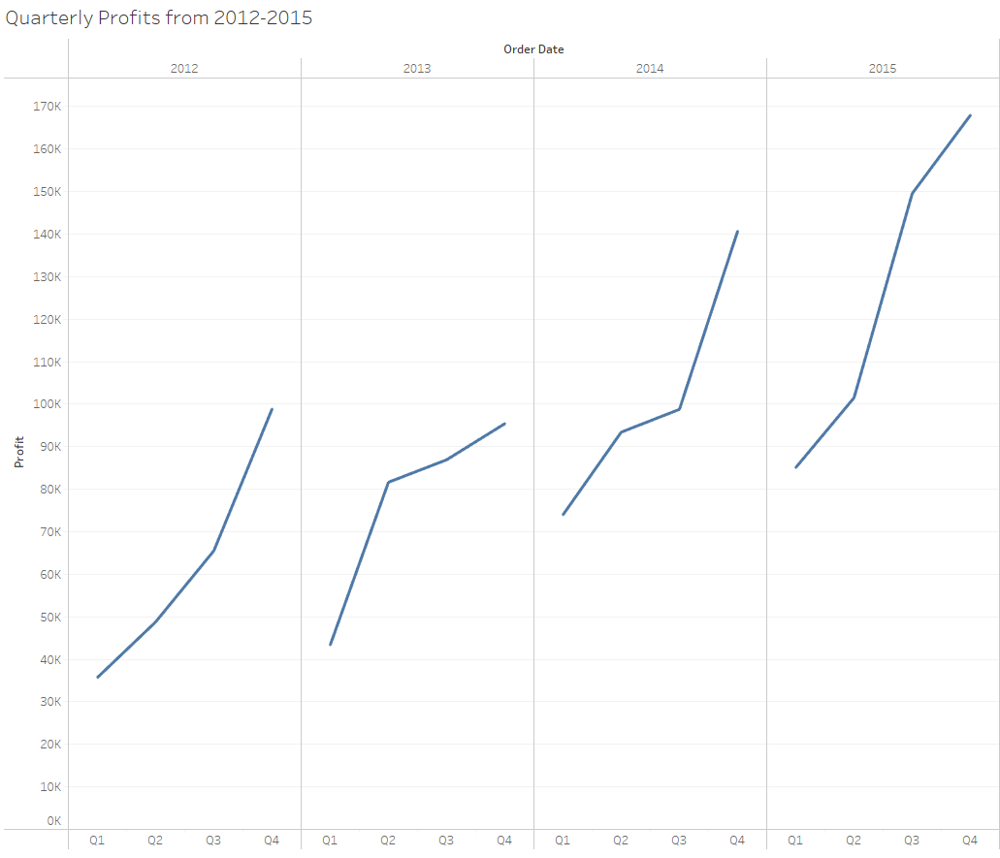

In [16]:
display.Image(r"C:\Users\ryanp\Desktop\Springboard\Springboard\Quarterly_Profits.png")

Overall, the business has been increasing in profits during 2012-2015. There is an identifiabe pattern with highest profit during Q4 and dropping with the upcoming Q1. This can be related to the holiday season with an increase in spending by customers. 

### Location

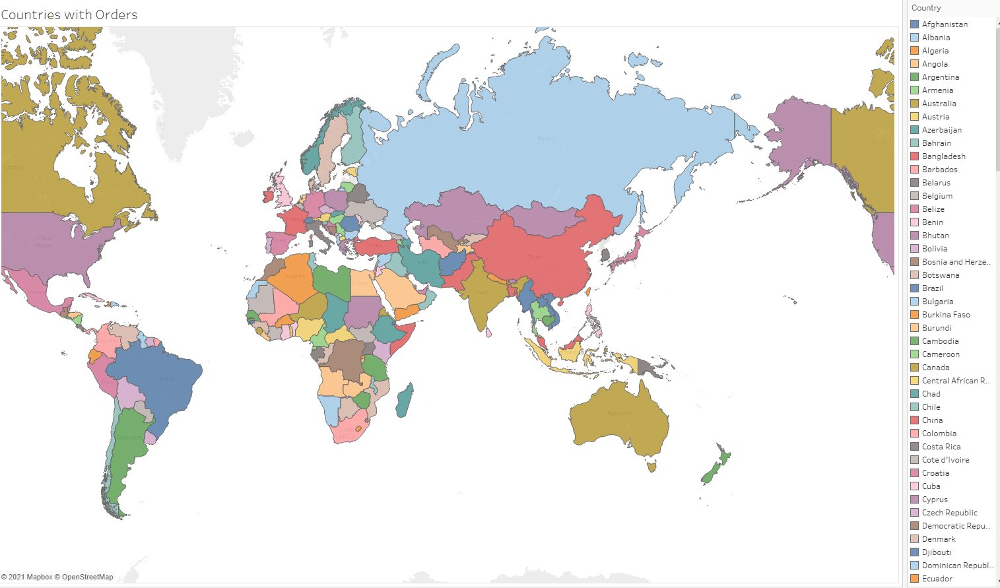

In [17]:
display.Image(r"C:\Users\ryanp\Desktop\Springboard\Springboard\Map_with_orders.png")

In [18]:
data['Country'].nunique()

151

In [19]:
country_count = data['Country'].value_counts().sort_values(ascending=False).head(20)
fig = px.scatter(country_count, x=country_count.index, y=country_count.values, size=country_count.values, size_max=100)
fig.update_layout(
    yaxis_title="# of Orders per Country",
    xaxis_title="Country")
fig.show()

A large portion of orders came from the United States. 

In [20]:
state_count = data['State'].value_counts().sort_values(ascending=False).head(20)
fig = px.scatter(state_count, x=state_count.index, y=state_count.values, size=state_count.values, size_max=100)
fig.update_layout(
    yaxis_title="# of Orders per State",
    xaxis_title="State")
fig.show()

In [21]:
data['State'].nunique()

929

There are a large amount of orders placed from California. It can be seen that many states from the U.S. are among the top 20 orders. 

In [22]:
city_count = data['City'].value_counts().sort_values(ascending=False).head(20)
fig = px.scatter(city_count, x=city_count.index, y=city_count.values, size=city_count.values, size_max=100)
fig.update_layout(
    yaxis_title="# of Orders per City",
    xaxis_title="City")
fig.show()

In [23]:
data['City'].nunique()

3257

In [24]:
region_count = data['Region'].value_counts().sort_values(ascending=False).head(20)
fig = px.scatter(region_count, x=region_count.index, y=region_count.values, size=region_count.values, size_max=100)
fig.update_layout(
    yaxis_title="# of Orders",
    xaxis_title="Region")
fig.show()

In [25]:
data['Region'].nunique()

23

Although California as a state had the most orders. New York City had the most orders by city. 

### Customer

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 <a list of 20 Text xticklabel objects>)

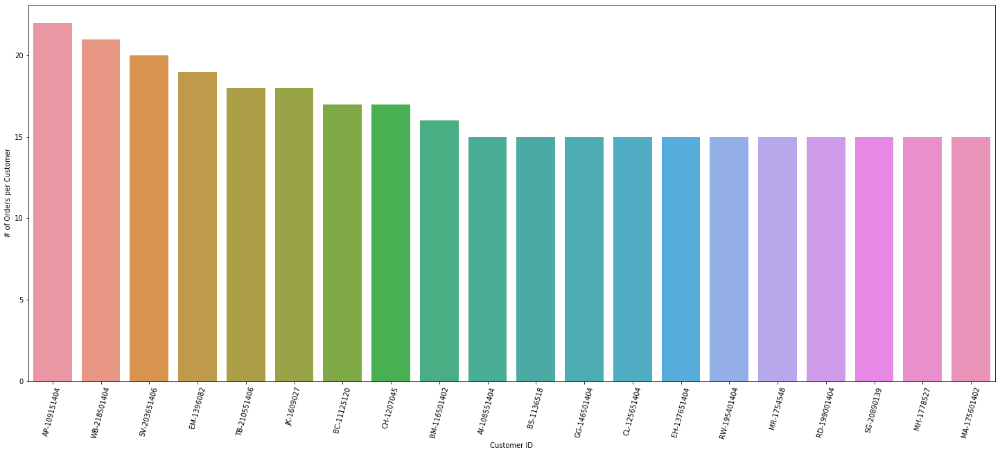

In [26]:
customer_count = data['Customer ID'].value_counts().head(20)
customer_count_ordered = customer_count.sort_values(ascending=True)
plt.figure(figsize=(25, 10))
sns.barplot(x=customer_count_ordered.index, y=customer_count_ordered.values, order=customer_count.index)
plt.ylabel('# of Orders per Customer')
plt.xlabel('Customer ID')
plt.xticks(rotation=75)

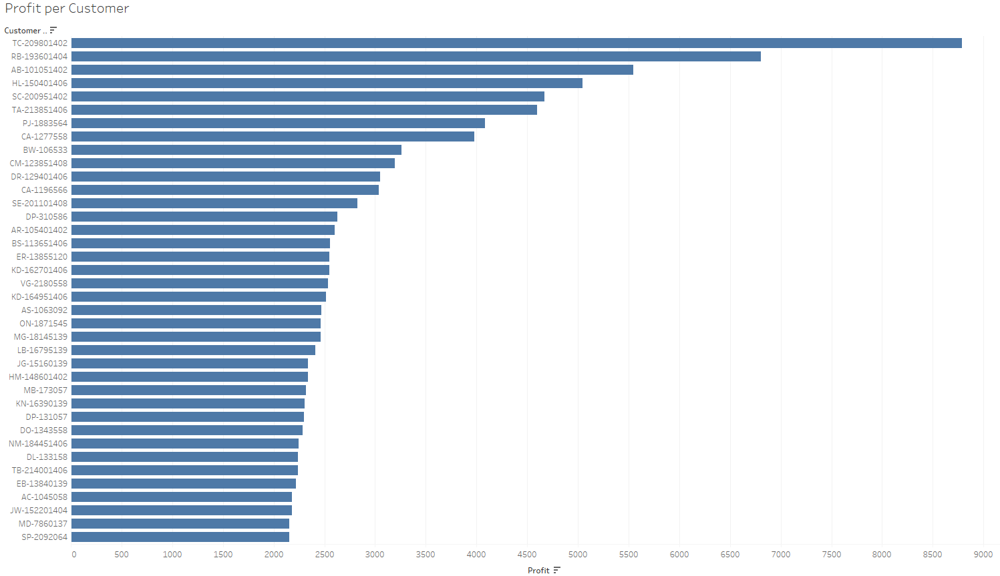

In [27]:
display.Image(r"C:\Users\ryanp\Desktop\Springboard\Springboard\Profit_per_Customers.png")

These graphs help us identify which customers had placed the most numbers of orders and provided the most profit. The highest profit by a customer was nearly $9,000 and the highest number of orders was nearly 25. 

### Product

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
 <a list of 30 Text xticklabel objects>)

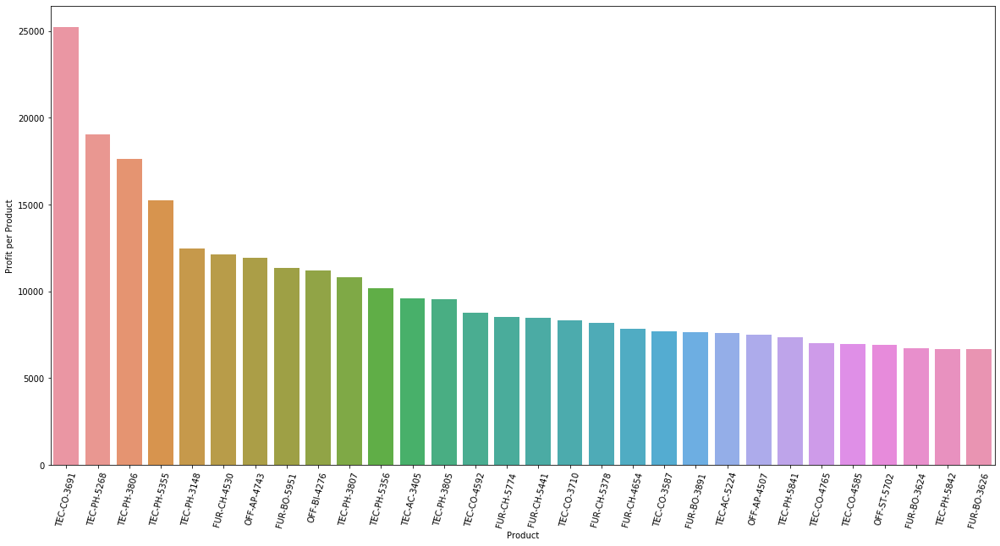

In [28]:
profit_per_product = data.groupby('Product ID')['Profit'].sum().sort_values(ascending=False).head(30)
plt.figure(figsize=(20, 10))
sns.barplot(profit_per_product.index, profit_per_product.values)
plt.ylabel('Profit per Product')
plt.xlabel('Product')
plt.xticks(rotation=75)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
 <a list of 30 Text xticklabel objects>)

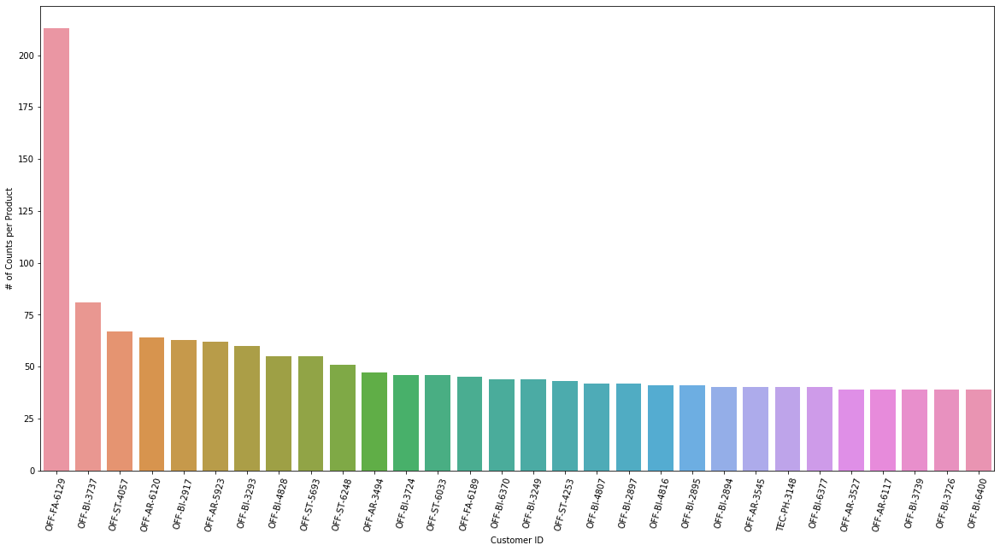

In [29]:
product_count = data['Product ID'].value_counts().sort_values(ascending=False).head(30)
plt.figure(figsize=(20, 10))
sns.barplot(product_count.index, product_count.values)
plt.ylabel('# of Counts per Product')
plt.xlabel('Customer ID')
plt.xticks(rotation=75)

In [30]:
data['Product ID'].nunique()

3717

In [31]:
data['Product Name'].nunique()

3717

(array([0, 1, 2]), <a list of 3 Text xticklabel objects>)

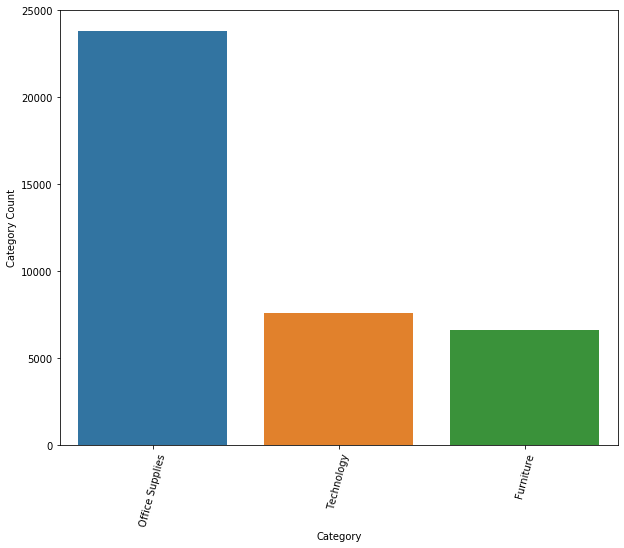

In [32]:
product_cat_count = data['Category'].value_counts().sort_values(ascending=False).head(30)
plt.figure(figsize=(10, 8))
sns.barplot(product_cat_count.index, product_cat_count.values)
plt.ylabel('Category Count')
plt.xlabel('Category')
plt.xticks(rotation=75)

Office Supplies were the highest category that the customers mostly ordered. This can be a future focus for the business to improve office supplies to possibly have the higest increase in profits. 

In [33]:
data['Category'].nunique()

3

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 <a list of 17 Text xticklabel objects>)

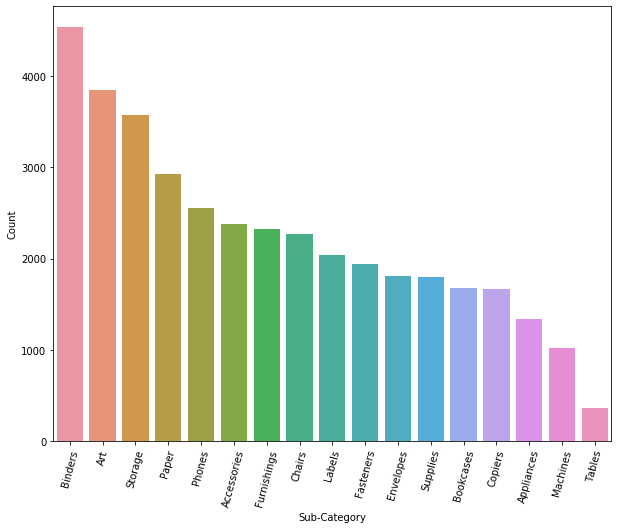

In [34]:
product_subcat_count = data['Sub-Category'].value_counts().sort_values(ascending=False)
plt.figure(figsize=(10, 8))
sns.barplot(product_subcat_count.index, product_subcat_count.values)
plt.ylabel('Count')
plt.xlabel('Sub-Category')
plt.xticks(rotation=75)

In [35]:
data['Sub-Category'].nunique()

17

Text(0.5, 0, 'Segment')

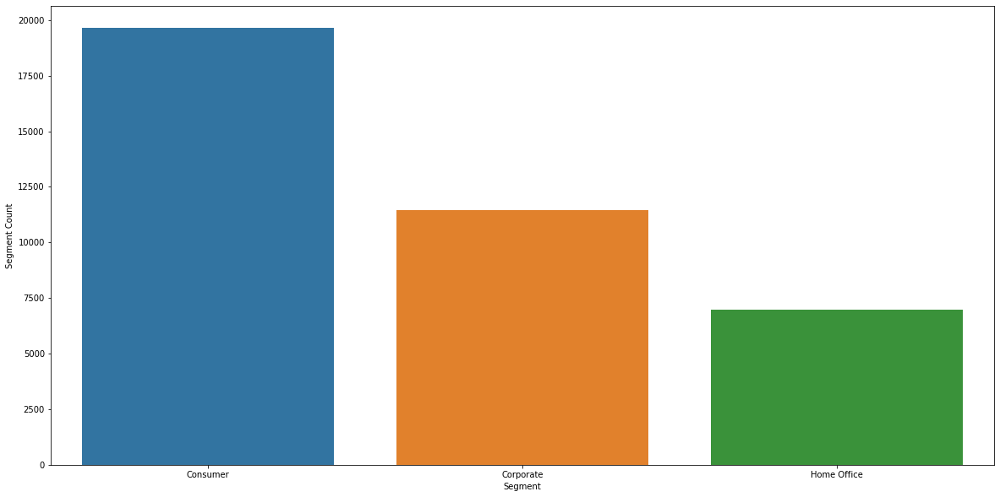

In [36]:
segment_count = data['Segment'].value_counts().sort_values(ascending=False)
plt.figure(figsize=(20, 10))
sns.barplot(segment_count.index, segment_count.values)
plt.ylabel('Segment Count')
plt.xlabel('Segment')

Text(0.5, 0, 'Ship Mode')

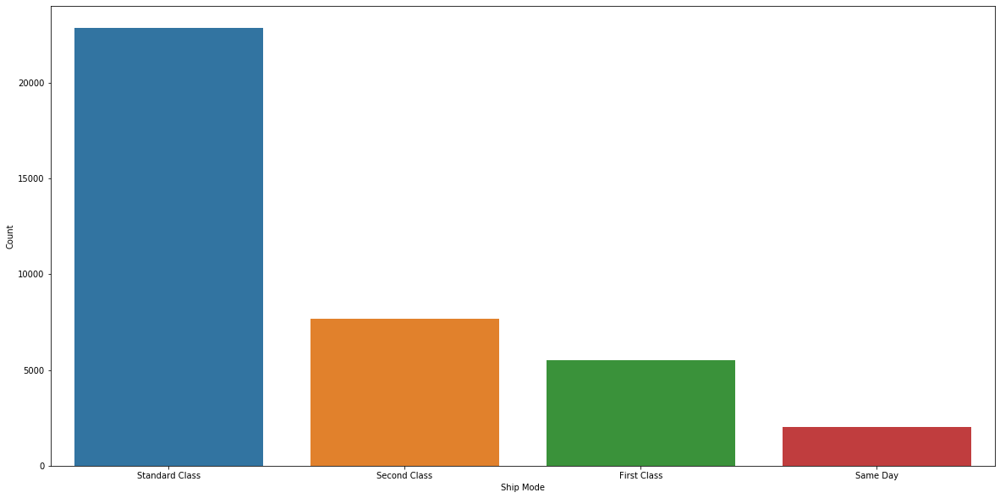

In [37]:
ship_mode_count = data['Ship Mode'].value_counts().sort_values(ascending=False)
plt.figure(figsize=(20, 10))
sns.barplot(ship_mode_count.index, ship_mode_count.values)
plt.ylabel('Count')
plt.xlabel('Ship Mode')

Text(0.5, 0, 'Order Priority')

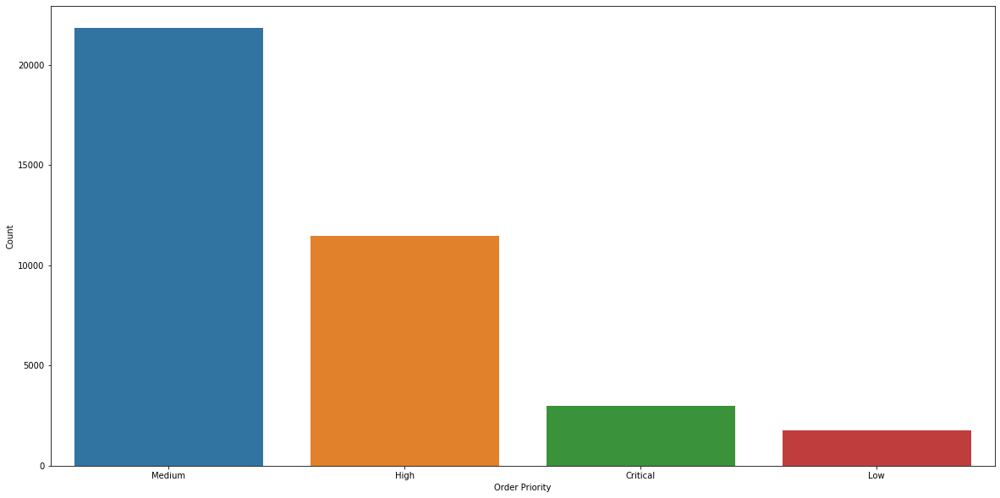

In [38]:
order_priority_count = data['Order Priority'].value_counts().sort_values(ascending=False)
plt.figure(figsize=(20, 10))
sns.barplot(order_priority_count.index, order_priority_count.values)
plt.ylabel('Count')
plt.xlabel('Order Priority')

In [39]:
data = data.drop(['Row ID', 'Ship Date', 'Customer Name', 'City', 'State', 'Shipping Cost', 'Country', 'State', 'City', 'Product Name'], axis=1)
data

,Order ID,Order Date,Ship Mode,Customer ID,Segment,Region,Market,Product ID,Category,Sub-Category,Sales,Quantity,Profit,Order Priority,Revenue
0,CA-2014-AB10015140-41954,2014-11-11,First Class,AB-100151402,Consumer,Central US,USCA,TEC-PH-5816,Technology,Phones,221.98,2,62.15,High,443.96
2,IN-2014-CR127307-41929,2014-10-17,First Class,CR-127307,Consumer,Oceania,Asia Pacific,TEC-PH-5356,Technology,Phones,5175.17,9,919.97,Medium,46576.53
4,SG-2014-RH9495111-41948,2014-11-05,Same Day,RH-9495111,Consumer,Western Africa,Africa,TEC-CO-6011,Technology,Copiers,2832.96,8,311.52,Critical,22663.68
5,IN-2014-JM156557-41818,2014-06-28,Second Class,JM-156557,Corporate,Oceania,Asia Pacific,TEC-PH-5842,Technology,Phones,2862.68,5,763.28,Critical,14313.40
6,IN-2012-TS2134092-41219,2012-11-06,First Class,TS-2134092,Consumer,Oceania,Asia Pacific,FUR-CH-5378,Furniture,Chairs,1822.08,4,564.84,Critical,7288.32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51285,IN-2015-KE1642066-42174,2015-06-19,Same Day,KE-1642066,Corporate,Eastern Asia,Asia Pacific,OFF-FA-3072,Office Supplies,Fasteners,65.10,5,4.50,Medium,325.50
51286,US-2014-ZD21925140-41765,2014-05-06,Standard Class,ZD-219251408,Consumer,Southern US,USCA,FUR-FU-4070,Furniture,Furnishings,16.72,5,3.34,High,83.60
51287,CA-2012-ZD21925140-41147,2012-08-26,Second Class,ZD-219251404,Consumer,Western US,USCA,OFF-AR-5321,Office Supplies,Art,8.56,2,2.48,High,17.12
51288,MX-2013-RB1979518-41322,2013-02-17,Standard Class,RB-1979518,Home Office,South America,LATAM,OFF-BI-2919,Office Supplies,Binders,13.44,2,2.40,Medium,26.88


## Customer Segmentation

The customer's behavior will be segmented by the RFM analysis. RFM stands for Recency, Frequency, and Monetary value and each category is a key representation of customer traits. 
 - R: most recent activity from customer
 - F: how often the customers makes a transaction
 - M: the amount of spending by customer

Identifying customer behavior can bring tremendous value for the business. This can help focus on where to begin investing within the company to improve quality and retain customers. 

### Recent Purchase

In [40]:
from datetime import datetime

today = datetime.date(data['Order Date'].max())
print(today)

2015-12-31


In [41]:
start = datetime.date(data['Order Date'].min())
print(start)

2012-01-01


In [42]:
data['Date'] = pd.to_datetime(data['Order Date']).dt.date
data['Date']

0        2014-11-11
2        2014-10-17
4        2014-11-05
5        2014-06-28
6        2012-11-06
            ...    
51285    2015-06-19
51286    2014-05-06
51287    2012-08-26
51288    2013-02-17
51289    2013-05-22
Name: Date, Length: 38078, dtype: object

In [43]:
recent_purchase = data.groupby('Customer ID', as_index=False)['Order Date'].max()
recent_purchase['Order Date'] = pd.DatetimeIndex(recent_purchase['Order Date']).date
recent_purchase['Recency'] = today - recent_purchase['Order Date']
recent_purchase.columns = ['Customer ID', 'Order Date', 'Recency']
recent_purchase

,Customer ID,Order Date,Recency
0,AA-10315102,2015-01-07,358 days
1,AA-10315120,2013-05-16,959 days
2,AA-10315139,2015-08-04,149 days
3,AA-103151402,2015-06-30,184 days
4,AA-103151404,2013-10-04,818 days
...,...,...,...
14307,ZD-2192548,2013-12-11,750 days
14308,ZD-2192564,2012-02-21,1409 days
14309,ZD-219257,2012-09-19,1198 days
14310,ZD-2192582,2015-06-18,196 days


In [44]:
recent_purchase = recent_purchase.drop(['Order Date'], axis=1)
recent_purchase

,Customer ID,Recency
0,AA-10315102,358 days
1,AA-10315120,959 days
2,AA-10315139,149 days
3,AA-103151402,184 days
4,AA-103151404,818 days
...,...,...
14307,ZD-2192548,750 days
14308,ZD-2192564,1409 days
14309,ZD-219257,1198 days
14310,ZD-2192582,196 days


The recency category is made based on the last date of the dataset to have the most up-to-date data. 

### Frequency

In [45]:
frequency = data.groupby('Customer ID', as_index=False)['Order ID'].count()
frequency.columns = ['Customer ID', 'Frequency']
frequency

,Customer ID,Frequency
0,AA-10315102,1
1,AA-10315120,1
2,AA-10315139,12
3,AA-103151402,5
4,AA-103151404,3
...,...,...
14307,ZD-2192548,3
14308,ZD-2192564,1
14309,ZD-219257,1
14310,ZD-2192582,2


The frequency category is created to show how many orders were placed between 2012-2015 by each customer. 

### Spending

In [46]:
spending = data.groupby('Customer ID', as_index=False)['Revenue'].sum()
spending.columns = ['Customer ID', 'Spending']
spending

,Customer ID,Spending
0,AA-10315102,348.51
1,AA-10315120,18993.87
2,AA-10315139,9707.91
3,AA-103151402,2702.18
4,AA-103151404,1507.02
...,...,...
14307,ZD-2192548,478.32
14308,ZD-2192564,490.86
14309,ZD-219257,239.76
14310,ZD-2192582,1946.32


The spending category is created to show how much each customer has spent in total between 2012-2015. 

#### Data Merge

In [47]:
test_data = pd.merge(recent_purchase, frequency, on = 'Customer ID')
test_data = pd.merge(test_data, spending, on = 'Customer ID')
test_data

,Customer ID,Recency,Frequency,Spending
0,AA-10315102,358 days,1,348.51
1,AA-10315120,959 days,1,18993.87
2,AA-10315139,149 days,12,9707.91
3,AA-103151402,184 days,5,2702.18
4,AA-103151404,818 days,3,1507.02
...,...,...,...,...
14307,ZD-2192548,750 days,3,478.32
14308,ZD-2192564,1409 days,1,490.86
14309,ZD-219257,1198 days,1,239.76
14310,ZD-2192582,196 days,2,1946.32


In [48]:
test_data['Recency'] = test_data['Recency'].dt.days
test_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14312 entries, 0 to 14311
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Customer ID  14312 non-null  object 
 1   Recency      14312 non-null  int64  
 2   Frequency    14312 non-null  int64  
 3   Spending     14312 non-null  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 559.1+ KB


In [49]:
quartiles = test_data.quantile(q=[0.25, 0.5, 0.75])
quartiles

,Recency,Frequency,Spending
0.25,149.0,1.0,242.4000
0.50,425.0,2.0,1003.7400
0.75,809.0,3.0,3633.1425


In [50]:
test_data.describe()

,Recency,Frequency,Spending
count,14312.000000,14312.000000,14312.000000
mean,510.882337,2.660565,3418.423026
std,401.153148,2.139745,6625.732420
min,0.000000,1.000000,2.060000
25%,149.000000,1.000000,242.400000
50%,425.000000,2.000000,1003.740000
75%,809.000000,3.000000,3633.142500
max,1460.000000,22.000000,134386.470000


The RFM categories are merged to create one dataframe that can be used for analysis. Here is a quick summary of each category. One thing to note is the minimum value of recency is 0 since the most recent purchase was the day of the last day of the dataset. 

In [51]:
recency_quartiles = range(3, 0, -1)
frequency_quartiles = range(1, 4)
spending_quartiles = range(1, 4)

Quartiles are created for each category. It is noted that the recency category is starting from 3 and going down in increments. This is since the most recent activity should be in the higher category since active customers are the one's to be desired. 

In [52]:
recency_group = pd.cut(test_data['Recency'], bins=3, labels=recency_quartiles)
puchase_count = pd.cut(test_data['Frequency'], bins=3, labels=frequency_quartiles)
spending = pd.cut(test_data['Spending'], bins=3, labels=spending_quartiles)

In [53]:
test_data['R'] = recency_group.values
test_data['F'] = puchase_count.values
test_data['M'] = spending.values
test_data['RFM_Score'] = test_data[['R', 'F', 'M']].sum(axis=1)
test_data

,Customer ID,Recency,Frequency,Spending,R,F,M,RFM_Score
0,AA-10315102,358,1,348.51,3,1,1,5
1,AA-10315120,959,1,18993.87,2,1,1,4
2,AA-10315139,149,12,9707.91,3,2,1,6
3,AA-103151402,184,5,2702.18,3,1,1,5
4,AA-103151404,818,3,1507.02,2,1,1,4
...,...,...,...,...,...,...,...,...
14307,ZD-2192548,750,3,478.32,2,1,1,4
14308,ZD-2192564,1409,1,490.86,1,1,1,3
14309,ZD-219257,1198,1,239.76,1,1,1,3
14310,ZD-2192582,196,2,1946.32,3,1,1,5


The categories are given a value and the values are summed to create an RFM score. The highest value will be a 9 and the lower value will be a 3. 

In [54]:
test_data['RFM_Score'].unique()

array([5, 4, 6, 3, 7, 8], dtype=int64)

In [55]:
def Customer_levels(test_data):
    if test_data['RFM_Score'] >= 8:
        return "Elite"
    elif test_data['RFM_Score'] >= 6:
        return "High"
    elif test_data['RFM_Score'] >= 4:
        return "Medium"
    else:
        return "Low"

In [56]:
test_data['Customer_Score'] = test_data.apply(Customer_levels, axis=1)
test_data

,Customer ID,Recency,Frequency,Spending,R,F,M,RFM_Score,Customer_Score
0,AA-10315102,358,1,348.51,3,1,1,5,Medium
1,AA-10315120,959,1,18993.87,2,1,1,4,Medium
2,AA-10315139,149,12,9707.91,3,2,1,6,High
3,AA-103151402,184,5,2702.18,3,1,1,5,Medium
4,AA-103151404,818,3,1507.02,2,1,1,4,Medium
...,...,...,...,...,...,...,...,...,...
14307,ZD-2192548,750,3,478.32,2,1,1,4,Medium
14308,ZD-2192564,1409,1,490.86,1,1,1,3,Low
14309,ZD-219257,1198,1,239.76,1,1,1,3,Low
14310,ZD-2192582,196,2,1946.32,3,1,1,5,Medium


The customers are segmented and given a Customer score. The customers can now be easily identified based on there behaviors, how well they compare to other customers based on recency, frequency, and monetary. The business can utilize this in ways to help focus on customers that bring in the most profitiablity and engagement for the business. This is a great opportunity for the marketing team to focus on the higher score customers. 

In [57]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14312 entries, 0 to 14311
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   Customer ID     14312 non-null  object  
 1   Recency         14312 non-null  int64   
 2   Frequency       14312 non-null  int64   
 3   Spending        14312 non-null  float64 
 4   R               14312 non-null  category
 5   F               14312 non-null  category
 6   M               14312 non-null  category
 7   RFM_Score       14312 non-null  int64   
 8   Customer_Score  14312 non-null  object  
dtypes: category(3), float64(1), int64(3), object(2)
memory usage: 825.0+ KB


In [58]:
test_data['R'] = test_data['R'].astype(int)
test_data['F'] = test_data['F'].astype(int)
test_data['M'] = test_data['M'].astype(int)
test_data.dtypes

Customer ID        object
Recency             int64
Frequency           int64
Spending          float64
R                   int32
F                   int32
M                   int32
RFM_Score           int64
Customer_Score     object
dtype: object

Minor changes to the data for further analysis. 

## Pre-Processing

The insight on the new categorical data. 

In [59]:
data.head()

,Order ID,Order Date,Ship Mode,Customer ID,Segment,Region,Market,Product ID,Category,Sub-Category,Sales,Quantity,Profit,Order Priority,Revenue,Date
0,CA-2014-AB10015140-41954,2014-11-11,First Class,AB-100151402,Consumer,Central US,USCA,TEC-PH-5816,Technology,Phones,221.98,2,62.15,High,443.96,2014-11-11
2,IN-2014-CR127307-41929,2014-10-17,First Class,CR-127307,Consumer,Oceania,Asia Pacific,TEC-PH-5356,Technology,Phones,5175.17,9,919.97,Medium,46576.53,2014-10-17
4,SG-2014-RH9495111-41948,2014-11-05,Same Day,RH-9495111,Consumer,Western Africa,Africa,TEC-CO-6011,Technology,Copiers,2832.96,8,311.52,Critical,22663.68,2014-11-05
5,IN-2014-JM156557-41818,2014-06-28,Second Class,JM-156557,Corporate,Oceania,Asia Pacific,TEC-PH-5842,Technology,Phones,2862.68,5,763.28,Critical,14313.40,2014-06-28
6,IN-2012-TS2134092-41219,2012-11-06,First Class,TS-2134092,Consumer,Oceania,Asia Pacific,FUR-CH-5378,Furniture,Chairs,1822.08,4,564.84,Critical,7288.32,2012-11-06


In [60]:
test_data.head()

,Customer ID,Recency,Frequency,Spending,R,F,M,RFM_Score,Customer_Score
0,AA-10315102,358,1,348.51,3,1,1,5,Medium
1,AA-10315120,959,1,18993.87,2,1,1,4,Medium
2,AA-10315139,149,12,9707.91,3,2,1,6,High
3,AA-103151402,184,5,2702.18,3,1,1,5,Medium
4,AA-103151404,818,3,1507.02,2,1,1,4,Medium


In [61]:
test_data = pd.merge(test_data, data, on = 'Customer ID')
test_data

,Customer ID,Recency,Frequency,Spending,R,F,M,RFM_Score,Customer_Score,Order ID,...,Market,Product ID,Category,Sub-Category,Sales,Quantity,Profit,Order Priority,Revenue,Date
0,AA-10315102,358,1,348.51,3,1,1,5,Medium,ID-2015-AA10315102-42011,...,Asia Pacific,TEC-MA-5001,Technology,Machines,116.17,3,35.62,Medium,348.51,2015-01-07
1,AA-10315120,959,1,18993.87,2,1,1,4,Medium,ES-2013-AA10315120-41410,...,Europe,FUR-BO-5969,Furniture,Bookcases,2713.41,7,27.09,Medium,18993.87,2013-05-16
2,AA-10315139,149,12,9707.91,3,2,1,6,High,ES-2015-AA10315139-42220,...,Europe,TEC-PH-5813,Technology,Phones,504.36,3,65.52,High,1513.08,2015-08-04
3,AA-10315139,149,12,9707.91,3,2,1,6,High,ES-2015-AA10315139-42220,...,Europe,TEC-PH-5358,Technology,Phones,622.20,5,124.35,High,3111.00,2015-08-04
4,AA-10315139,149,12,9707.91,3,2,1,6,High,ES-2015-AA10315139-42220,...,Europe,FUR-BO-3634,Furniture,Bookcases,512.19,3,46.08,High,1536.57,2015-08-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38073,ZD-219257,1198,1,239.76,1,1,1,3,Low,IN-2012-ZD219257-41171,...,Asia Pacific,OFF-FA-6200,Office Supplies,Fasteners,59.94,4,11.94,Medium,239.76,2012-09-19
38074,ZD-2192582,196,2,1946.32,3,1,1,5,Medium,MX-2015-ZD2192582-42173,...,LATAM,TEC-CO-6000,Technology,Copiers,590.12,3,69.74,Critical,1770.36,2015-06-18
38075,ZD-2192582,196,2,1946.32,3,1,1,5,Medium,MX-2013-ZD2192582-41604,...,LATAM,FUR-FU-6253,Furniture,Furnishings,87.98,2,7.30,Low,175.96,2013-11-26
38076,ZD-2192596,749,2,1476.33,2,1,1,4,Medium,IT-2013-ZD2192596-41620,...,Europe,TEC-AC-5220,Technology,Accessories,135.63,3,40.68,Medium,406.89,2013-12-12


In [62]:
df = px.data.tips()
fig = px.histogram(test_data, x="Customer_Score", color='Customer_Score')
fig.show()

In [63]:
df = px.data.tips()
fig = px.histogram(test_data, x="Recency")
fig.show()

In [64]:
df = px.data.tips()
fig = px.histogram(test_data, x="Frequency")
fig.show()

In [65]:
df = px.data.tips()
fig = px.histogram(test_data, x="Spending")
fig.show()

The RFM data shows that each category is heavily right-skewed. The data needs to be unskewed to create a better dataset for the prediction model. 

In [66]:
test_data.columns

Index(['Customer ID', 'Recency', 'Frequency', 'Spending', 'R', 'F', 'M',
       'RFM_Score', 'Customer_Score', 'Order ID', 'Order Date', 'Ship Mode',
       'Segment', 'Region', 'Market', 'Product ID', 'Category', 'Sub-Category',
       'Sales', 'Quantity', 'Profit', 'Order Priority', 'Revenue', 'Date'],
      dtype='object')

In [67]:
test_data.head()

,Customer ID,Recency,Frequency,Spending,R,F,M,RFM_Score,Customer_Score,Order ID,...,Market,Product ID,Category,Sub-Category,Sales,Quantity,Profit,Order Priority,Revenue,Date
0,AA-10315102,358,1,348.51,3,1,1,5,Medium,ID-2015-AA10315102-42011,...,Asia Pacific,TEC-MA-5001,Technology,Machines,116.17,3,35.62,Medium,348.51,2015-01-07
1,AA-10315120,959,1,18993.87,2,1,1,4,Medium,ES-2013-AA10315120-41410,...,Europe,FUR-BO-5969,Furniture,Bookcases,2713.41,7,27.09,Medium,18993.87,2013-05-16
2,AA-10315139,149,12,9707.91,3,2,1,6,High,ES-2015-AA10315139-42220,...,Europe,TEC-PH-5813,Technology,Phones,504.36,3,65.52,High,1513.08,2015-08-04
3,AA-10315139,149,12,9707.91,3,2,1,6,High,ES-2015-AA10315139-42220,...,Europe,TEC-PH-5358,Technology,Phones,622.20,5,124.35,High,3111.00,2015-08-04
4,AA-10315139,149,12,9707.91,3,2,1,6,High,ES-2015-AA10315139-42220,...,Europe,FUR-BO-3634,Furniture,Bookcases,512.19,3,46.08,High,1536.57,2015-08-04


In [68]:
test_data = test_data.drop(['Customer_Score', 'Customer ID', 'Product ID', 'Order Date', 'Order ID', 'Date', 'Profit', 
                            'Sales', 'Revenue', 'Quantity', 'Profit', 'Region', 'Sub-Category'], axis=1)
test_data

,Recency,Frequency,Spending,R,F,M,RFM_Score,Ship Mode,Segment,Market,Category,Order Priority
0,358,1,348.51,3,1,1,5,Standard Class,Consumer,Asia Pacific,Technology,Medium
1,959,1,18993.87,2,1,1,4,Standard Class,Consumer,Europe,Furniture,Medium
2,149,12,9707.91,3,2,1,6,Second Class,Consumer,Europe,Technology,High
3,149,12,9707.91,3,2,1,6,Second Class,Consumer,Europe,Technology,High
4,149,12,9707.91,3,2,1,6,Second Class,Consumer,Europe,Furniture,High
...,...,...,...,...,...,...,...,...,...,...,...,...
38073,1198,1,239.76,1,1,1,3,Second Class,Consumer,Asia Pacific,Office Supplies,Medium
38074,196,2,1946.32,3,1,1,5,Second Class,Consumer,LATAM,Technology,Critical
38075,196,2,1946.32,3,1,1,5,Standard Class,Consumer,LATAM,Furniture,Low
38076,749,2,1476.33,2,1,1,4,Standard Class,Consumer,Europe,Technology,Medium


In [69]:
R_Q1 = np.quantile(test_data['Recency'],0.25)
R_Q3 = np.quantile(test_data['Recency'],0.75)
R_IQR = R_Q3 - R_Q1
R_cut_off = R_IQR * 1.5
R_lower, R_upper = R_Q1 - R_cut_off, R_Q3 + R_cut_off
R_outliers = [x for x in test_data['Recency'] if x < R_lower or x > R_upper]
R_removed = [x for x in test_data['Recency'] if x > R_lower and x < R_upper]
print('Percentiles: 25th=%.3f, 75th=%.3f, IQR=%.3f' % (R_Q1, R_Q3, R_IQR))
print('outliers: %d' % len(R_outliers))
print('Non-outlier: %d' % len(R_removed))

Percentiles: 25th=116.000, 75th=705.000, IQR=589.000
outliers: 0
Non-outlier: 38078


In [70]:
test_data = test_data[test_data['Recency'].between(R_lower, R_upper)]

In [71]:
F_Q1 = np.quantile(test_data['Frequency'],0.25)
F_Q3 = np.quantile(test_data['Frequency'],0.75)
F_IQR = F_Q3 - F_Q1
F_cut_off = F_IQR * 1.5
F_lower, F_upper = F_Q1 - F_cut_off, F_Q3 + F_cut_off
F_outliers = [x for x in test_data['Frequency'] if x < F_lower or x > F_upper]
F_removed = [x for x in test_data['Frequency'] if x > F_lower and x < F_upper]
print('Percentiles: 25th=%.3f, 75th=%.3f, IQR=%.3f' % (F_Q1, F_Q3, F_IQR))
print('outliers: %d' % len(F_outliers))
print('Non-outlier: %d' % len(F_removed))

Percentiles: 25th=2.000, 75th=6.000, IQR=4.000
outliers: 736
Non-outlier: 36934


In [72]:
test_data = test_data[test_data['Frequency'].between(F_lower, F_upper)]

In [73]:
M_Q1 = np.quantile(test_data['Spending'],0.25)
M_Q3 = np.quantile(test_data['Spending'],0.75)
M_IQR = M_Q3 - M_Q1
M_cut_off = M_IQR * 1.5
M_lower, M_upper = M_Q1 - M_cut_off, M_Q3 + M_cut_off
M_outliers = [x for x in test_data['Spending'] if x < M_lower or x > M_upper]
M_removed = [x for x in test_data['Spending'] if x > M_lower and x < M_upper]
print('Percentiles: 25th=%.3f, 75th=%.3f, IQR=%.3f' % (M_Q1, M_Q3, M_IQR))
print('outliers: %d' % len(M_outliers))
print('Non-outlier: %d' % len(M_removed))

Percentiles: 25th=690.595, 75th=6753.222, IQR=6062.627
outliers: 3063
Non-outlier: 34279


In [74]:
test_data = test_data[test_data['Spending'].between(M_lower , M_upper)]

In [75]:
test_data.shape

(34279, 12)

More features were added with the RFM segmentation to create a model that will use more specifications to identify customer behaviors. Not all columns will be used due to the increase of dimensionality and computational power. The get_dummies were used on the categorical data in order for the model to have a numerical value. 

In [76]:
dummy = ['Ship Mode', 'Segment', 'Market', 'Category', 'Order Priority']

In [77]:
new_X = test_data[dummy]

In [78]:
new_X = pd.get_dummies(new_X)

In [79]:
new_X.shape

(34279, 19)

In [80]:
test_data = pd.concat([test_data, new_X], axis=1)
test_data.head()

,Recency,Frequency,Spending,R,F,M,RFM_Score,Ship Mode,Segment,Market,...,Market_Europe,Market_LATAM,Market_USCA,Category_Furniture,Category_Office Supplies,Category_Technology,Order Priority_Critical,Order Priority_High,Order Priority_Low,Order Priority_Medium
0,358,1,348.51,3,1,1,5,Standard Class,Consumer,Asia Pacific,...,0,0,0,0,0,1,0,0,0,1
2,149,12,9707.91,3,2,1,6,Second Class,Consumer,Europe,...,1,0,0,0,0,1,0,1,0,0
3,149,12,9707.91,3,2,1,6,Second Class,Consumer,Europe,...,1,0,0,0,0,1,0,1,0,0
4,149,12,9707.91,3,2,1,6,Second Class,Consumer,Europe,...,1,0,0,1,0,0,0,1,0,0
5,149,12,9707.91,3,2,1,6,Second Class,Consumer,Europe,...,1,0,0,0,0,1,1,0,0,0


In [81]:
test_data.columns

Index(['Recency', 'Frequency', 'Spending', 'R', 'F', 'M', 'RFM_Score',
       'Ship Mode', 'Segment', 'Market', 'Category', 'Order Priority',
       'Ship Mode_First Class', 'Ship Mode_Same Day', 'Ship Mode_Second Class',
       'Ship Mode_Standard Class', 'Segment_Consumer', 'Segment_Corporate',
       'Segment_Home Office', 'Market_Africa', 'Market_Asia Pacific',
       'Market_Europe', 'Market_LATAM', 'Market_USCA', 'Category_Furniture',
       'Category_Office Supplies', 'Category_Technology',
       'Order Priority_Critical', 'Order Priority_High', 'Order Priority_Low',
       'Order Priority_Medium'],
      dtype='object')

In [82]:
test_data = test_data.drop(columns=['Ship Mode', 'Segment', 'Market', 'Category', 'Order Priority', 
                                    'R', 'F', 'M', 'RFM_Score'])
test_data

,Recency,Frequency,Spending,Ship Mode_First Class,Ship Mode_Same Day,Ship Mode_Second Class,Ship Mode_Standard Class,Segment_Consumer,Segment_Corporate,Segment_Home Office,...,Market_Europe,Market_LATAM,Market_USCA,Category_Furniture,Category_Office Supplies,Category_Technology,Order Priority_Critical,Order Priority_High,Order Priority_Low,Order Priority_Medium
0,358,1,348.51,0,0,0,1,1,0,0,...,0,0,0,0,0,1,0,0,0,1
2,149,12,9707.91,0,0,1,0,1,0,0,...,1,0,0,0,0,1,0,1,0,0
3,149,12,9707.91,0,0,1,0,1,0,0,...,1,0,0,0,0,1,0,1,0,0
4,149,12,9707.91,0,0,1,0,1,0,0,...,1,0,0,1,0,0,0,1,0,0
5,149,12,9707.91,0,0,1,0,1,0,0,...,1,0,0,0,0,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38073,1198,1,239.76,0,0,1,0,1,0,0,...,0,0,0,0,1,0,0,0,0,1
38074,196,2,1946.32,0,0,1,0,1,0,0,...,0,1,0,0,0,1,1,0,0,0
38075,196,2,1946.32,0,0,0,1,1,0,0,...,0,1,0,1,0,0,0,0,1,0
38076,749,2,1476.33,0,0,0,1,1,0,0,...,1,0,0,0,0,1,0,0,0,1


The Customer ID and Score are dropped to decrease dimensionality and overfitting of the data. 

In [83]:
test_data.describe()

,Recency,Frequency,Spending,Ship Mode_First Class,Ship Mode_Same Day,Ship Mode_Second Class,Ship Mode_Standard Class,Segment_Consumer,Segment_Corporate,Segment_Home Office,...,Market_Europe,Market_LATAM,Market_USCA,Category_Furniture,Category_Office Supplies,Category_Technology,Order Priority_Critical,Order Priority_High,Order Priority_Low,Order Priority_Medium
count,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,...,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000
mean,454.407655,3.961405,3519.914984,0.144432,0.052802,0.200910,0.601855,0.518072,0.297529,0.184399,...,0.247178,0.203594,0.214680,0.171300,0.634412,0.194288,0.076782,0.300884,0.048455,0.573879
std,383.995751,2.504957,3762.385915,0.351533,0.223641,0.400687,0.489523,0.499681,0.457178,0.387815,...,0.431377,0.402676,0.410606,0.376777,0.481602,0.395657,0.266249,0.458649,0.214729,0.494519
min,0.000000,1.000000,2.060000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,121.000000,2.000000,595.820000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,372.000000,3.000000,2103.840000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,733.000000,5.000000,5276.010000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000
max,1460.000000,12.000000,15834.520000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [84]:
test_data['Recency'] += 1

Based on the data summary, there is a 0 value in the Recency column. 1 was added to the column in order to log the data. Logging the data will unskew the data to have a better normal distribution. 

In [85]:
test_data.describe()

,Recency,Frequency,Spending,Ship Mode_First Class,Ship Mode_Same Day,Ship Mode_Second Class,Ship Mode_Standard Class,Segment_Consumer,Segment_Corporate,Segment_Home Office,...,Market_Europe,Market_LATAM,Market_USCA,Category_Furniture,Category_Office Supplies,Category_Technology,Order Priority_Critical,Order Priority_High,Order Priority_Low,Order Priority_Medium
count,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,...,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000
mean,455.407655,3.961405,3519.914984,0.144432,0.052802,0.200910,0.601855,0.518072,0.297529,0.184399,...,0.247178,0.203594,0.214680,0.171300,0.634412,0.194288,0.076782,0.300884,0.048455,0.573879
std,383.995751,2.504957,3762.385915,0.351533,0.223641,0.400687,0.489523,0.499681,0.457178,0.387815,...,0.431377,0.402676,0.410606,0.376777,0.481602,0.395657,0.266249,0.458649,0.214729,0.494519
min,1.000000,1.000000,2.060000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,122.000000,2.000000,595.820000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,373.000000,3.000000,2103.840000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,734.000000,5.000000,5276.010000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000
max,1461.000000,12.000000,15834.520000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


1 is added to the entire dataset to take the log of the data. This will unskew the data, which we can then scale the data. 

In [86]:
test_data['Recency'] = np.log(test_data['Recency'])
test_data['Frequency'] = np.log(test_data['Frequency'])
test_data['Spending'] = np.log(test_data['Spending'])

In [87]:
test_data.describe()

,Recency,Frequency,Spending,Ship Mode_First Class,Ship Mode_Same Day,Ship Mode_Second Class,Ship Mode_Standard Class,Segment_Consumer,Segment_Corporate,Segment_Home Office,...,Market_Europe,Market_LATAM,Market_USCA,Category_Furniture,Category_Office Supplies,Category_Technology,Order Priority_Critical,Order Priority_High,Order Priority_Low,Order Priority_Medium
count,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,...,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000,34279.000000
mean,5.562807,1.161704,7.343527,0.144432,0.052802,0.200910,0.601855,0.518072,0.297529,0.184399,...,0.247178,0.203594,0.214680,0.171300,0.634412,0.194288,0.076782,0.300884,0.048455,0.573879
std,1.299530,0.685352,1.581045,0.351533,0.223641,0.400687,0.489523,0.499681,0.457178,0.387815,...,0.431377,0.402676,0.410606,0.376777,0.481602,0.395657,0.266249,0.458649,0.214729,0.494519
min,0.000000,0.000000,0.722706,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.804021,0.693147,6.389939,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5.921578,1.098612,7.651520,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,6.598509,1.609438,8.570925,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000
max,7.286876,2.484907,9.669948,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [88]:
standard_scaler = StandardScaler()
robust_scaler = RobustScaler()

In [89]:
standard_scaler.fit(test_data)
standard_scaled = standard_scaler.transform(test_data)
standard_scaled = pd.DataFrame(data=standard_scaled, index=test_data.index, columns=test_data.columns)
standard_scaled

,Recency,Frequency,Spending,Ship Mode_First Class,Ship Mode_Same Day,Ship Mode_Second Class,Ship Mode_Standard Class,Segment_Consumer,Segment_Corporate,Segment_Home Office,...,Market_Europe,Market_LATAM,Market_USCA,Category_Furniture,Category_Office Supplies,Category_Technology,Order Priority_Critical,Order Priority_High,Order Priority_Low,Order Priority_Medium
0,0.246643,-1.695072,-0.942340,-0.410871,-0.236105,-0.501422,0.813344,0.964486,-0.650805,-0.475488,...,-0.573005,-0.505610,-0.522844,-0.454653,-1.317315,2.036418,-0.288388,-0.656032,-0.225661,0.861700
2,-0.424907,1.930719,1.162014,-0.410871,-0.236105,1.994329,-1.229492,0.964486,-0.650805,-0.475488,...,1.745186,-0.505610,-0.522844,-0.454653,-1.317315,2.036418,-0.288388,1.524317,-0.225661,-1.160496
3,-0.424907,1.930719,1.162014,-0.410871,-0.236105,1.994329,-1.229492,0.964486,-0.650805,-0.475488,...,1.745186,-0.505610,-0.522844,-0.454653,-1.317315,2.036418,-0.288388,1.524317,-0.225661,-1.160496
4,-0.424907,1.930719,1.162014,-0.410871,-0.236105,1.994329,-1.229492,0.964486,-0.650805,-0.475488,...,1.745186,-0.505610,-0.522844,2.199478,-1.317315,-0.491058,-0.288388,1.524317,-0.225661,-1.160496
5,-0.424907,1.930719,1.162014,-0.410871,-0.236105,1.994329,-1.229492,0.964486,-0.650805,-0.475488,...,1.745186,-0.505610,-0.522844,-0.454653,-1.317315,2.036418,3.467555,-0.656032,-0.225661,-1.160496
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38073,1.174623,-1.695072,-1.178914,-0.410871,-0.236105,1.994329,-1.229492,0.964486,-0.650805,-0.475488,...,-0.573005,-0.505610,-0.522844,-0.454653,0.759120,-0.491058,-0.288388,-0.656032,-0.225661,0.861700
38074,-0.215161,-0.683683,0.145582,-0.410871,-0.236105,1.994329,-1.229492,0.964486,-0.650805,-0.475488,...,-0.573005,1.977811,-0.522844,-0.454653,-1.317315,2.036418,3.467555,-0.656032,-0.225661,-1.160496
38075,-0.215161,-0.683683,0.145582,-0.410871,-0.236105,-0.501422,0.813344,0.964486,-0.650805,-0.475488,...,-0.573005,1.977811,-0.522844,2.199478,-1.317315,-0.491058,-0.288388,-0.656032,4.431430,-1.160496
38076,0.813587,-0.683683,-0.029229,-0.410871,-0.236105,-0.501422,0.813344,0.964486,-0.650805,-0.475488,...,1.745186,-0.505610,-0.522844,-0.454653,-1.317315,2.036418,-0.288388,-0.656032,-0.225661,0.861700


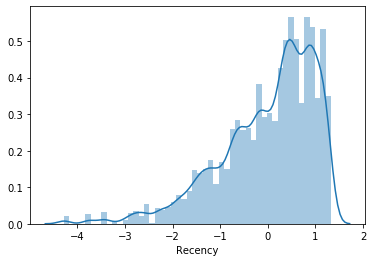

In [90]:
sns.distplot(standard_scaled['Recency'])

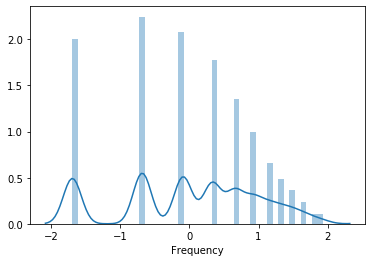

In [91]:
sns.distplot(standard_scaled['Frequency'])

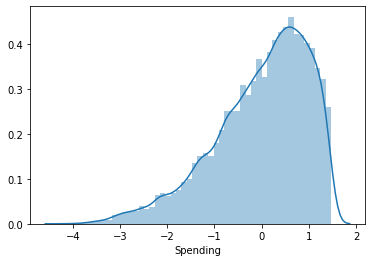

In [92]:
sns.distplot(standard_scaled['Spending'])

In [93]:
robust_scaler.fit(test_data)
robust_scaled = robust_scaler.transform(test_data)
robust_scaled = pd.DataFrame(data=robust_scaled, index=test_data.index, columns=test_data.columns)
robust_scaled

,Recency,Frequency,Spending,Ship Mode_First Class,Ship Mode_Same Day,Ship Mode_Second Class,Ship Mode_Standard Class,Segment_Consumer,Segment_Corporate,Segment_Home Office,...,Market_Europe,Market_LATAM,Market_USCA,Category_Furniture,Category_Office Supplies,Category_Technology,Order Priority_Critical,Order Priority_High,Order Priority_Low,Order Priority_Medium
0,-0.021319,-1.198978,-0.824330,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0
2,-0.507634,1.512942,0.701140,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,-1.0,1.0,0.0,1.0,0.0,-1.0
3,-0.507634,1.512942,0.701140,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,-1.0,1.0,0.0,1.0,0.0,-1.0
4,-0.507634,1.512942,0.701140,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,-1.0,0.0,0.0,1.0,0.0,-1.0
5,-0.507634,1.512942,0.701140,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,-1.0,1.0,1.0,0.0,0.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38073,0.650695,-1.198978,-0.995825,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
38074,-0.355742,-0.442507,-0.035683,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,-1.0,1.0,1.0,0.0,0.0,-1.0
38075,-0.355742,-0.442507,-0.035683,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,-1.0,0.0,0.0,0.0,1.0,-1.0
38076,0.389245,-0.442507,-0.162406,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0


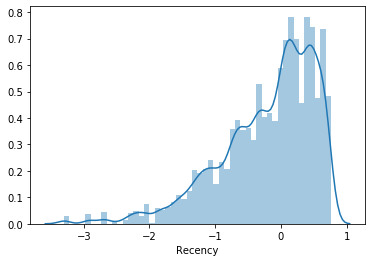

In [94]:
sns.distplot(robust_scaled['Recency'])

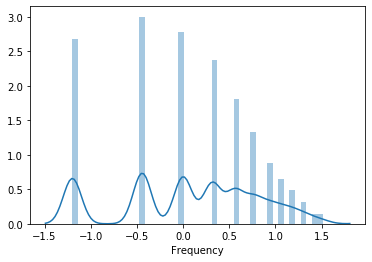

In [95]:
sns.distplot(robust_scaled['Frequency'])

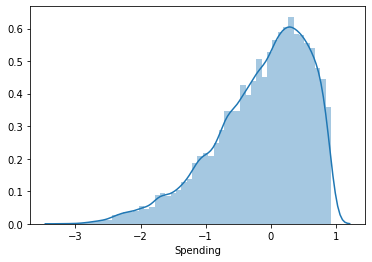

In [96]:
sns.distplot(robust_scaled['Spending'])

The data shows a much better distribution across the data and is not heavily right-skewed prior to the log and scale. After the data was logged, the data was also scaled for the data to have the same units. This will allow the model to know the values are weighed evenly. The data is ready for a test-split and ran through models. 

## Modeling

#### Test Data with Standard Scaling

#### Elbow Method

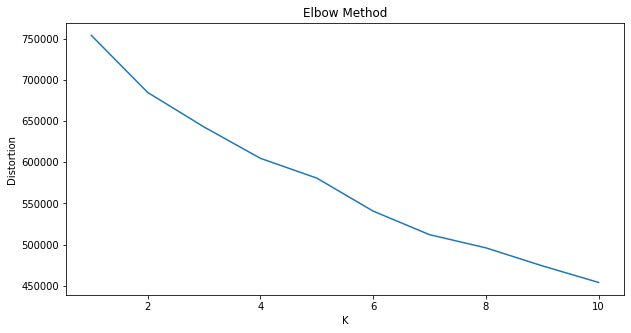

In [97]:
distortions = []
K = range(1,11)

X_standard = standard_scaled.to_numpy()

for k in K:
    model = KMeans(n_clusters=k)
    model.fit(X_standard)
    distortions.append(model.inertia_)

plt.figure(figsize=(10, 5))
plt.plot(K, distortions)
plt.xlabel('K')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

#### PCA

Text(0, 0.5, 'Cumulative Explained Variance')

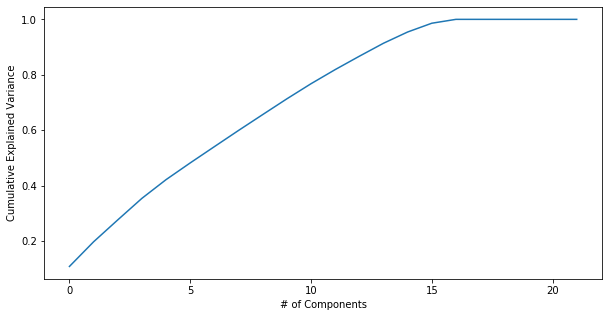

In [98]:
pca = PCA().fit(X_standard)
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('# of Components')
plt.ylabel('Cumulative Explained Variance')

In [99]:
pca = PCA(n_components=2)
pca.fit(X_standard)
pca_standard = pca.transform(X_standard)
print("Original shape: {}".format(str(X_standard.shape)))
print("Reduced shape: {}".format(str(pca_standard.shape)))

Original shape: (34279, 22)
Reduced shape: (34279, 2)


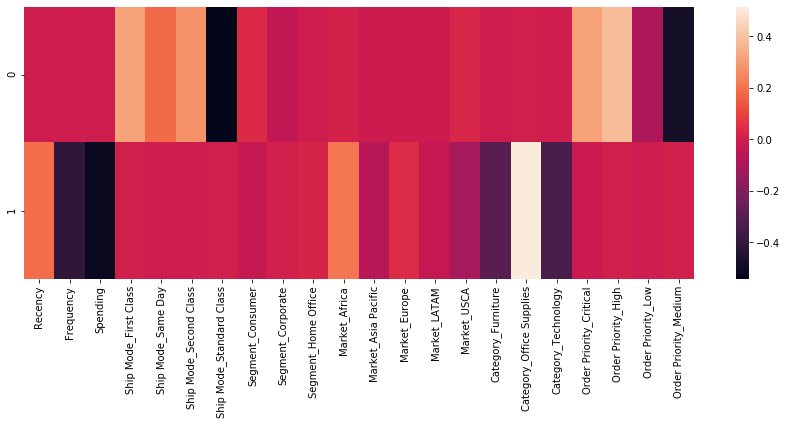

In [100]:
standard_coef = pd.DataFrame(pca.components_, columns=test_data.columns)
plt.figure(figsize=(15,5))
sns.heatmap(standard_coef, annot=False)

In [101]:
print("PC#1 Correlations\n", standard_coef.iloc[0].sort_values(ascending=False).head())
print("\n")
print("PC#2 Correlations\n", standard_coef.iloc[1].sort_values(ascending=False).head())

PC#1 Correlations
 Order Priority_High        0.383174
Ship Mode_First Class      0.320091
Order Priority_Critical    0.312807
Ship Mode_Second Class     0.277022
Ship Mode_Same Day         0.186362
Name: 0, dtype: float64


PC#2 Correlations
 Category_Office Supplies    0.513969
Market_Africa               0.210883
Recency                     0.190763
Market_Europe               0.042203
Segment_Home Office         0.022150
Name: 1, dtype: float64


#### KMeans

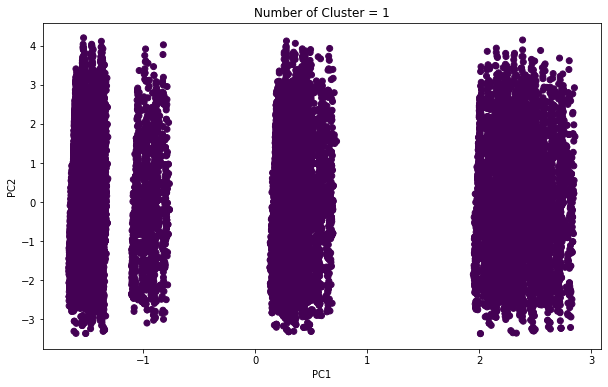

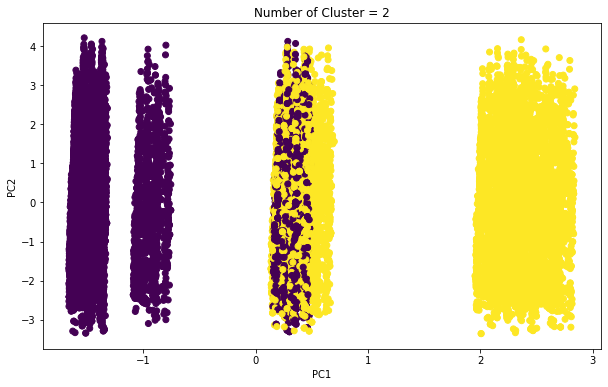

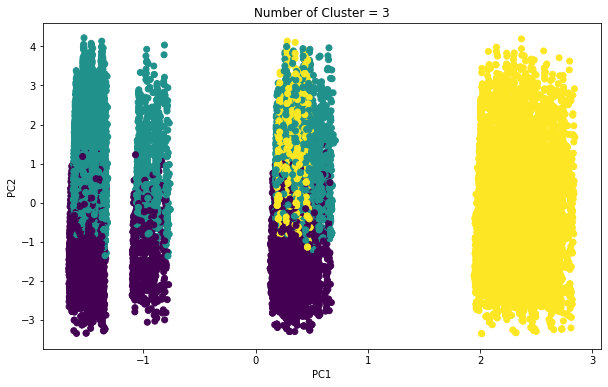

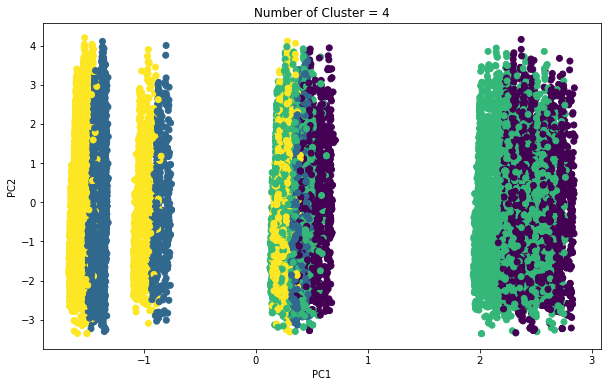

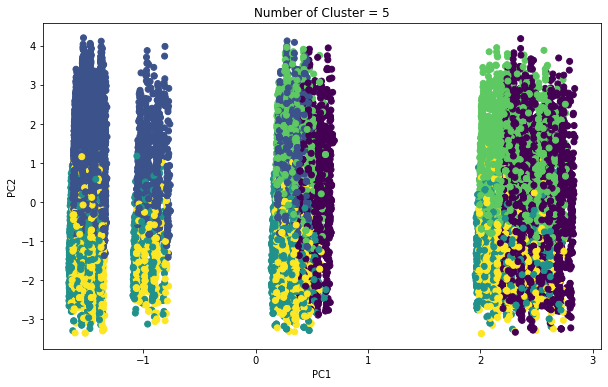

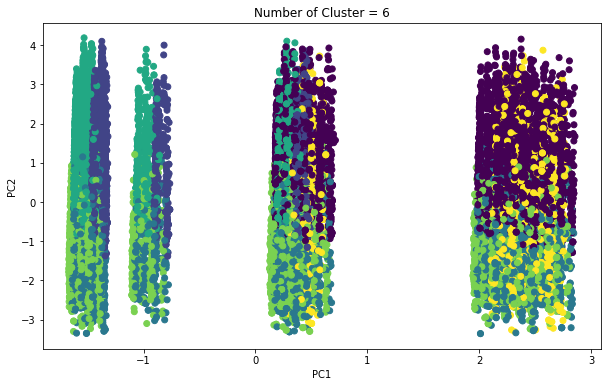

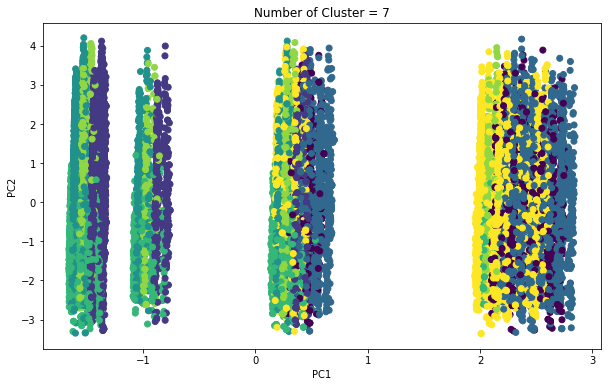

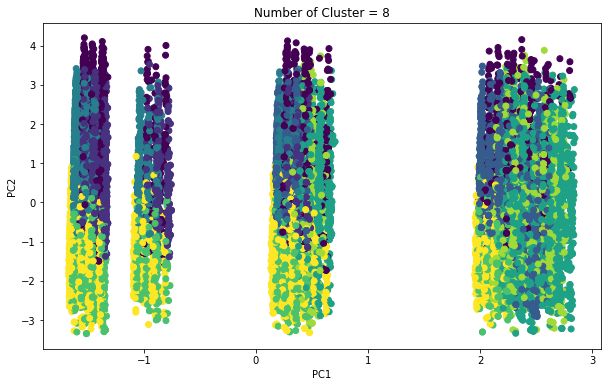

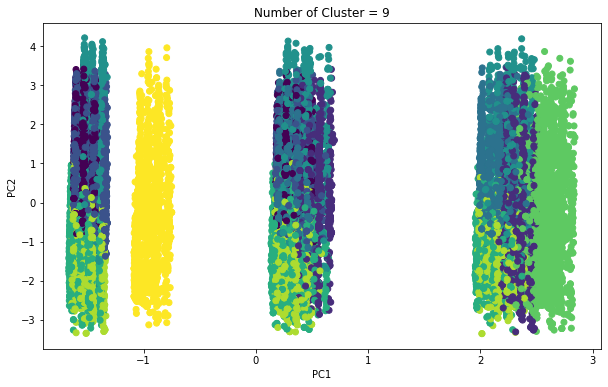

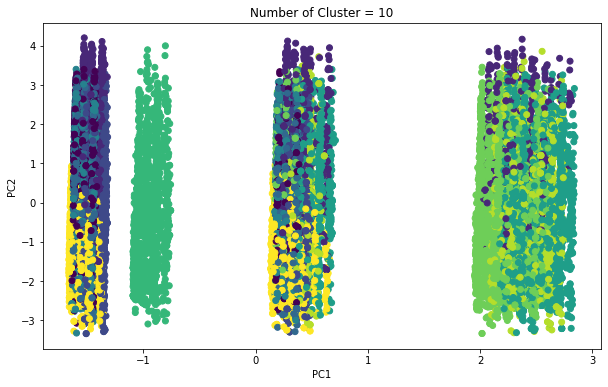

In [102]:
for i in K:
    model = sklearn.cluster.KMeans(n_clusters=i)
    clusters = model.fit_predict(X_standard)
    pca = sklearn.decomposition.PCA(n_components=2)
    pc1, pc2 = zip(*pca.fit_transform(X_standard))
    plt.figure(figsize=(10, 6))
    plt.title("Number of Cluster = %s" % i)
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.scatter(pc1, pc2, c=clusters.tolist())

In [103]:
kmeans_standard = KMeans(n_clusters=3)
kmeans_standard.fit(X_standard)
cluster_labels = kmeans_standard.labels_

In [104]:
data_labels = test_data.assign(Cluster=cluster_labels)
cluster_groups = data_labels.groupby(['Cluster'])

cluster_groups.agg({'Recency': 'mean', 
                    'Frequency': 'mean',
                    'Spending': ['mean','count']})

Recency Frequency  Spending       
             mean      mean      mean  count
Cluster                                     
0        5.542822  1.189041  7.385841   2632
1        5.571522  1.152231  7.334011  10314
2        5.561059  1.162911  7.342907  21333

#### Agglomerative Clustering - Hierarchical Clustering

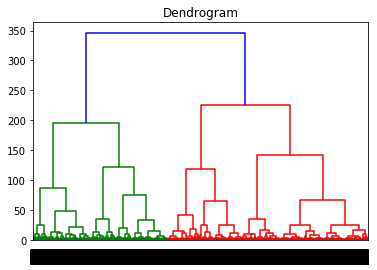

In [105]:
dendrogram = sch.dendrogram(sch.linkage(pca_standard, method='ward'))
plt.title('Dendrogram')
plt.show()

In [107]:
model = AgglomerativeClustering(n_clusters=4)
model.fit_predict(pca_standard)
labels = model.labels_

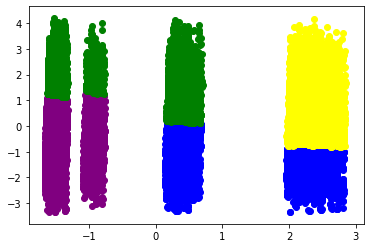

In [108]:
plt.scatter(pca_standard[labels==0, 0], pca_standard[labels==0, 1], marker="o", color='purple')
plt.scatter(pca_standard[labels==1, 0], pca_standard[labels==1, 1], marker="o", color='blue')
plt.scatter(pca_standard[labels==2, 0], pca_standard[labels==2, 1], marker="o", color='green')
plt.scatter(pca_standard[labels==3, 0], pca_standard[labels==3, 1], marker="o", color='yellow')
plt.show()

In [109]:
AC_standard = AgglomerativeClustering(n_clusters=4)
AC_standard.fit(pca_standard)
cluster_labels = AC_standard.labels_

In [110]:
data_labels = test_data.assign(Cluster=cluster_labels)
cluster_groups = data_labels.groupby(['Cluster'])

cluster_groups.agg({'Recency': 'mean', 
                    'Frequency': 'mean',
                    'Spending': ['mean','count']})

Recency Frequency  Spending       
             mean      mean      mean  count
Cluster                                     
0        5.450195  1.336918  7.849476  12878
1        5.255392  1.452847  8.213733   7831
2        5.973563  0.670787  5.919005   7636
3        5.684321  1.028957  6.930222   5934

#### DBSCAN

In [111]:
dbscan_standard= DBSCAN(eps=0.24, min_samples=3)
clusters = dbscan_standard.fit_predict(pca_standard)

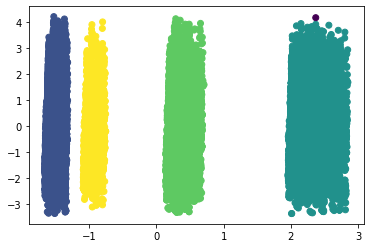

In [112]:
plt.scatter(pca_standard[:,0], pca_standard[:,1], c=clusters)

### Robust Scaled

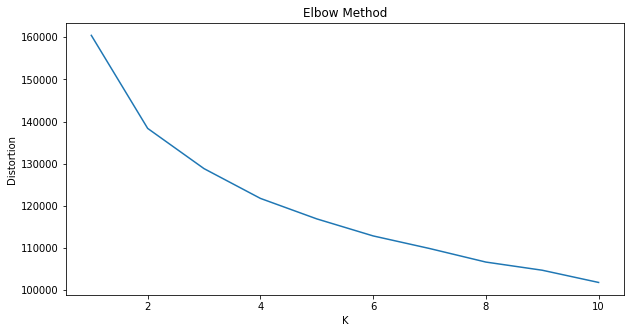

In [113]:
distortions = []
K = range(1,11)

X_robust = robust_scaled.to_numpy()

for k in K:
    model = KMeans(n_clusters=k)
    model.fit(X_robust)
    distortions.append(model.inertia_)

plt.figure(figsize=(10, 5))
plt.plot(K, distortions)
plt.xlabel('K')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

Text(0, 0.5, 'Cumulative Explained Variance')

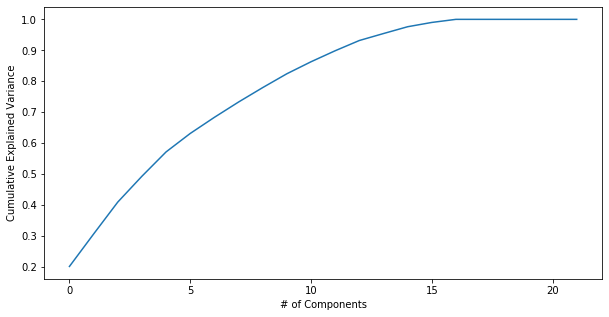

In [114]:
pca = PCA().fit(X_robust)
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('# of Components')
plt.ylabel('Cumulative Explained Variance')

In [115]:
pca = PCA(n_components=2)
pca.fit(X_robust)
pca_robust = pca.transform(X_robust)
print("Original shape: {}".format(str(X_robust.shape)))
print("Reduced shape: {}".format(str(pca_robust.shape)))

Original shape: (34279, 22)
Reduced shape: (34279, 2)


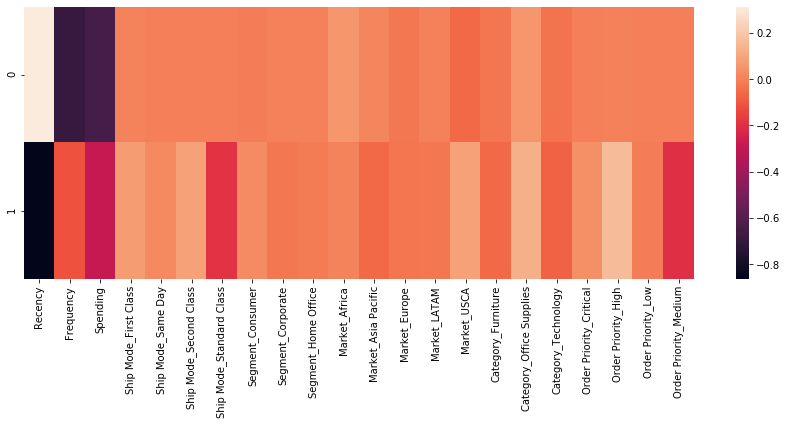

In [116]:
robust_coef = pd.DataFrame(pca.components_, columns=test_data.columns)
plt.figure(figsize=(15,5))
sns.heatmap(robust_coef, annot=False)

In [117]:
print("PC#1 Correlations\n", robust_coef.iloc[0].sort_values(ascending=False).head())
print("\n")
print("PC#2 Correlations\n", robust_coef.iloc[1].sort_values(ascending=False).head())

PC#1 Correlations
 Recency                     0.312620
Market_Africa               0.057769
Category_Office Supplies    0.056271
Market_Asia Pacific         0.015251
Ship Mode_First Class       0.005614
Name: 0, dtype: float64


PC#2 Correlations
 Order Priority_High         0.167005
Category_Office Supplies    0.132346
Market_USCA                 0.091197
Ship Mode_Second Class      0.088523
Ship Mode_First Class       0.076280
Name: 1, dtype: float64


#### KMeans

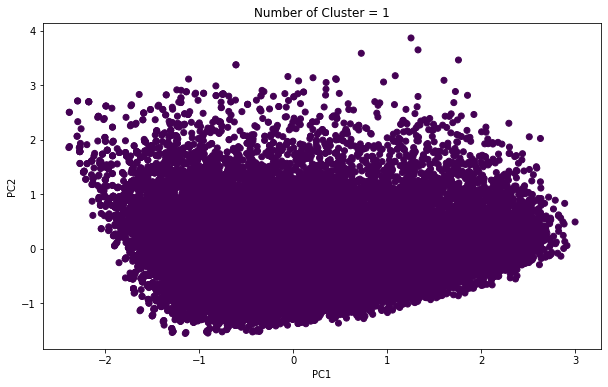

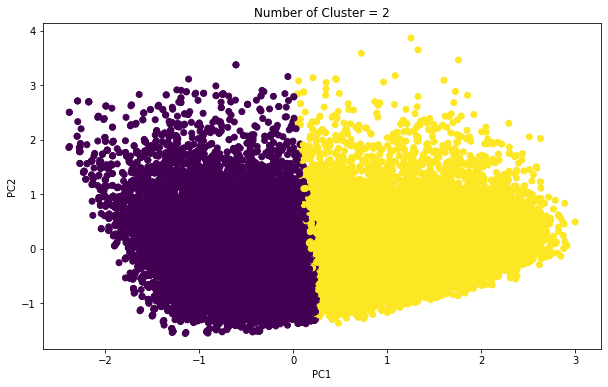

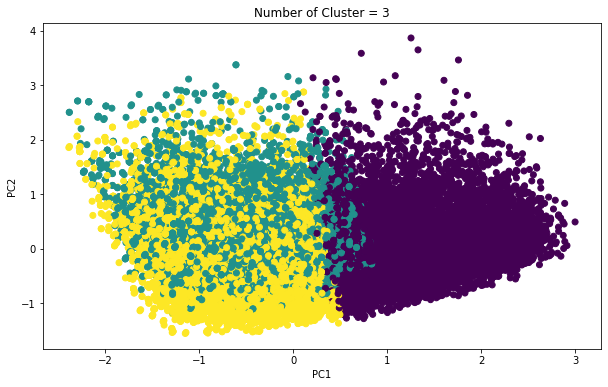

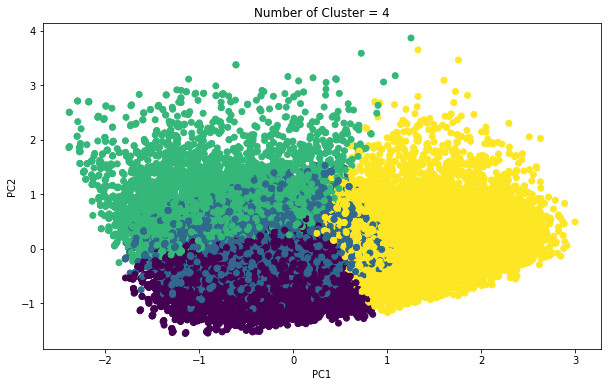

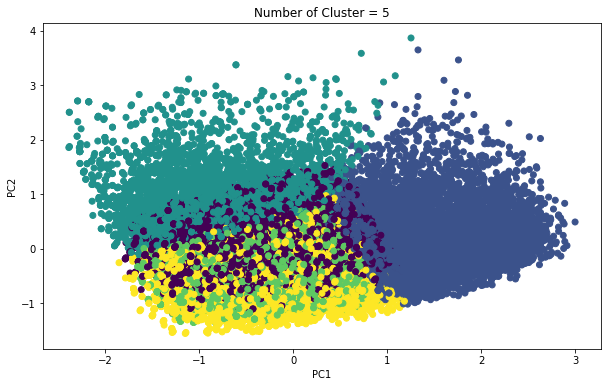

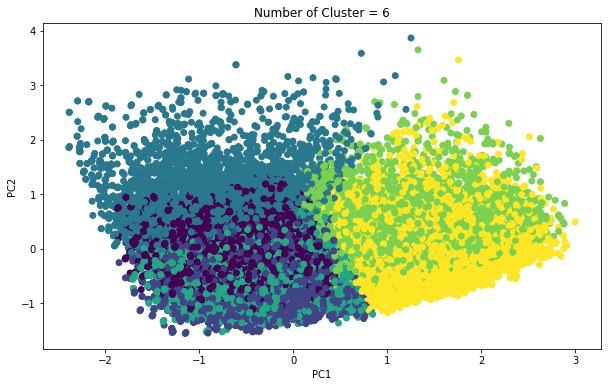

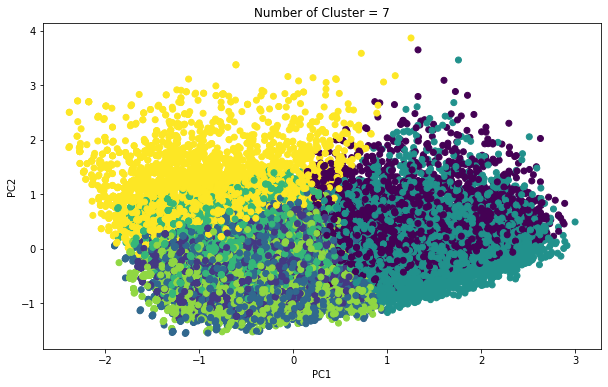

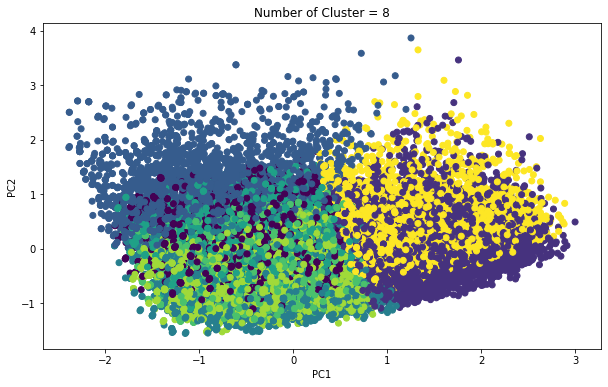

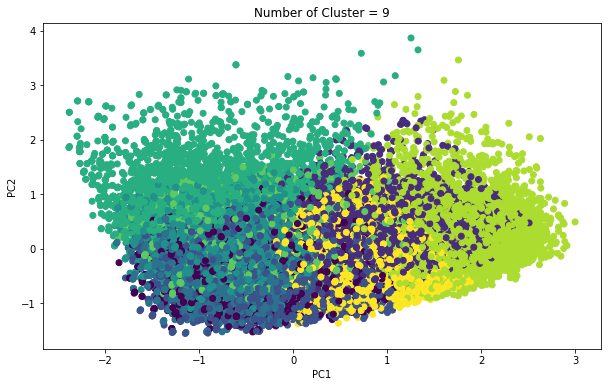

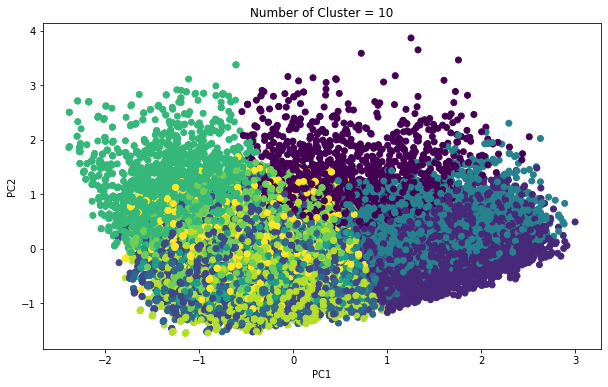

In [118]:
for i in K:
    model = sklearn.cluster.KMeans(n_clusters=i)
    clusters = model.fit_predict(X_robust)
    pca = sklearn.decomposition.PCA(n_components=2)
    pc1, pc2 = zip(*pca.fit_transform(X_robust))
    plt.figure(figsize=(10, 6))
    plt.title("Number of Cluster = %s" % i)
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.scatter(pc1, pc2, c=clusters.tolist())

In [119]:
kmeans_robust = KMeans(n_clusters=4)
kmeans_robust.fit(X_robust)
cluster_labels = kmeans_robust.labels_

In [120]:
data_labels = test_data.assign(Cluster=cluster_labels)
cluster_groups = data_labels.groupby(['Cluster'])

cluster_groups.agg({'Recency': 'mean', 
                    'Frequency': 'mean',
                    'Spending': ['mean','count']})

Recency Frequency  Spending       
             mean      mean      mean  count
Cluster                                     
0        6.041601  1.424266  8.070228  11487
1        5.905764  1.370127  7.933505   8292
2        3.453398  1.585096  8.020142   5850
3        6.024813  0.326890  5.355328   8650

#### Agglomerative Clustering - Hierarchical Clustering

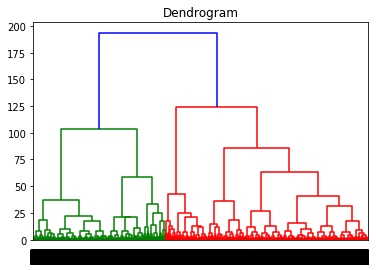

In [121]:
dendrogram = sch.dendrogram(sch.linkage(pca_robust, method='ward'))
plt.title('Dendrogram')
plt.show()

In [122]:
model = AgglomerativeClustering(n_clusters=5)
model.fit(pca_robust)
labels = model.labels_

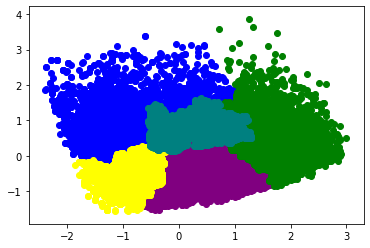

In [123]:
plt.scatter(pca_robust[labels==0, 0], pca_robust[labels==0, 1], marker="o", color='purple')
plt.scatter(pca_robust[labels==1, 0], pca_robust[labels==1, 1], marker="o", color='blue')
plt.scatter(pca_robust[labels==2, 0], pca_robust[labels==2, 1], marker="o", color='green')
plt.scatter(pca_robust[labels==3, 0], pca_robust[labels==3, 1], marker="o", color='yellow')
plt.scatter(pca_robust[labels==4, 0], pca_robust[labels==4, 1], marker="o", color='teal')
plt.show()

In [124]:
AC_robust = AgglomerativeClustering(n_clusters=5)
AC_robust.fit(pca_robust)
cluster_labels = AC_robust.labels_

In [125]:
data_labels = test_data.assign(Cluster=cluster_labels)
cluster_groups = data_labels.groupby(['Cluster'])

cluster_groups.agg({'Recency': 'mean', 
                    'Frequency': 'mean',
                    'Spending': ['mean','count']})

Recency Frequency  Spending       
             mean      mean      mean  count
Cluster                                     
0        6.399951  0.937160  7.206911  12620
1        3.690123  1.749075  8.362153   5967
2        5.997347  0.109704  4.504932   4180
3        5.878667  1.748715  8.628354   7613
4        4.636552  0.971226  6.761298   3899

#### DBSCAN

In [126]:
dbscan_standard= DBSCAN()
clusters = dbscan_standard.fit_predict(pca_robust)

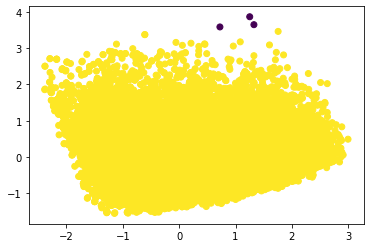

In [127]:
plt.scatter(pca_robust[:,0], pca_robust[:,1], c=clusters)

## Conclusion

#### Future Improvements: